# Computer vision - Lab 8


## Agenda

- introduction to the camera and its parameters
- advanced image processing techniques,
- understanding the scene as schemes, objects and optical effects,
- advanced film processing techniques,



## Helpers

### Libraries


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import cv2
import PIL
import os
import sys
import glob
import random

from pprint import pprint
from ipywidgets import Video

from PIL import Image
from PIL.ExifTags import TAGS, Base

### Datasets


* a set of stereoscopic images for the calibration of camera parameters

In [ ]:
!rm -rf ./cam_cal
!mkdir cam_cal
!wget -O cam_cal/left01.jpg https://github.com/opencv/opencv/raw/master/samples/data/left01.jpg -q --show-progress
!wget -O cam_cal/left02.jpg https://github.com/opencv/opencv/raw/master/samples/data/left02.jpg -q --show-progress
!wget -O cam_cal/left03.jpg https://github.com/opencv/opencv/raw/master/samples/data/left03.jpg -q --show-progress
!wget -O cam_cal/left04.jpg https://github.com/opencv/opencv/raw/master/samples/data/left04.jpg -q --show-progress
!wget -O cam_cal/left05.jpg https://github.com/opencv/opencv/raw/master/samples/data/left05.jpg -q --show-progress
!wget -O cam_cal/left06.jpg https://github.com/opencv/opencv/raw/master/samples/data/left06.jpg -q --show-progress
!wget -O cam_cal/left07.jpg https://github.com/opencv/opencv/raw/master/samples/data/left07.jpg -q --show-progress
!wget -O cam_cal/left08.jpg https://github.com/opencv/opencv/raw/master/samples/data/left08.jpg -q --show-progress
!wget -O cam_cal/left09.jpg https://github.com/opencv/opencv/raw/master/samples/data/left09.jpg -q --show-progress
!wget -O cam_cal/left11.jpg https://github.com/opencv/opencv/raw/master/samples/data/left11.jpg -q --show-progress
!wget -O cam_cal/left12.jpg https://github.com/opencv/opencv/raw/master/samples/data/left12.jpg -q --show-progress
!wget -O cam_cal/left13.jpg https://github.com/opencv/opencv/raw/master/samples/data/left13.jpg -q --show-progress
!wget -O cam_cal/left14.jpg https://github.com/opencv/opencv/raw/master/samples/data/left14.jpg -q --show-progress

!wget -O cam_cal/right01.jpg https://github.com/opencv/opencv/raw/master/samples/data/right01.jpg -q --show-progress
!wget -O cam_cal/right02.jpg https://github.com/opencv/opencv/raw/master/samples/data/right02.jpg -q --show-progress
!wget -O cam_cal/right03.jpg https://github.com/opencv/opencv/raw/master/samples/data/right03.jpg -q --show-progress
!wget -O cam_cal/right04.jpg https://github.com/opencv/opencv/raw/master/samples/data/right04.jpg -q --show-progress
!wget -O cam_cal/right05.jpg https://github.com/opencv/opencv/raw/master/samples/data/right05.jpg -q --show-progress
!wget -O cam_cal/right06.jpg https://github.com/opencv/opencv/raw/master/samples/data/right06.jpg -q --show-progress
!wget -O cam_cal/right07.jpg https://github.com/opencv/opencv/raw/master/samples/data/right07.jpg -q --show-progress
!wget -O cam_cal/right08.jpg https://github.com/opencv/opencv/raw/master/samples/data/right08.jpg -q --show-progress
!wget -O cam_cal/right09.jpg https://github.com/opencv/opencv/raw/master/samples/data/right09.jpg -q --show-progress
!wget -O cam_cal/right11.jpg https://github.com/opencv/opencv/raw/master/samples/data/right11.jpg -q --show-progress
!wget -O cam_cal/right12.jpg https://github.com/opencv/opencv/raw/master/samples/data/right12.jpg -q --show-progress
!wget -O cam_cal/right13.jpg https://github.com/opencv/opencv/raw/master/samples/data/right13.jpg -q --show-progress
!wget -O cam_cal/right14.jpg https://github.com/opencv/opencv/raw/master/samples/data/right14.jpg -q --show-progress

cam_cal/left01.jpg  100%[===================>]  27.25K  --.-KB/s    in 0s      
cam_cal/left02.jpg  100%[===================>]  27.94K  --.-KB/s    in 0s      
cam_cal/left03.jpg  100%[===================>]  28.86K  --.-KB/s    in 0s      
cam_cal/left04.jpg  100%[===================>]  24.56K  --.-KB/s    in 0s      
cam_cal/left05.jpg  100%[===================>]  28.07K  --.-KB/s    in 0s      
cam_cal/left06.jpg  100%[===================>]  27.86K  --.-KB/s    in 0s      
cam_cal/left07.jpg  100%[===================>]  29.16K  --.-KB/s    in 0s      
cam_cal/left08.jpg  100%[===================>]  28.02K  --.-KB/s    in 0s      
cam_cal/left09.jpg  100%[===================>]  26.61K  --.-KB/s    in 0s      
cam_cal/left11.jpg  100%[===================>]  27.10K  --.-KB/s    in 0s      
cam_cal/left12.jpg  100%[===================>]  25.00K  --.-KB/s    in 0s      
cam_cal/left13.jpg  100%[===================>]  27.47K  --.-KB/s    in 0s      
cam_cal/left14.jpg  100%[===============

* stereoscopic images from the Middlesbury dataset  [link](https://vision.middlebury.edu/stereo/data/scenes2006/).

In [ ]:
!gdown --id 17g5lfQkqXSIfJQLA2UHBZdoiD5PvV_tu
!gdown --id 176GBMR2o4_sYaPIo8Sdr3izTf4lilfVP

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=17g5lfQkqXSIfJQLA2UHBZdoiD5PvV_tu
To: /content/right-aloe-image.png
100% 208k/208k [00:00<00:00, 13.6MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=176GBMR2o4_sYaPIo8Sdr3izTf4lilfVP
To: /content/left-aloe-image.png
100% 208k/208k [00:00<00:00, 10.1MB/s]


* sudoku - a sample sudoku image from the OpenCV repository,

In [ ]:
!wget -O sudoku.png https://raw.githubusercontent.com/opencv/opencv/master/samples/data/sudoku.png -q --show-progress

sudoku.png          100%[===================>] 244.84K  --.-KB/s    in 0.004s  


* skittles - skittles image from wikimedia.org

In [ ]:
!wget -O skittles.jpg https://upload.wikimedia.org/wikipedia/commons/c/ca/Skittles-Louisiana-2003.jpg -q --show-progress

skittles.jpg        100%[===================>] 766.67K  3.37MB/s    in 0.2s    


* a frame from a football match between the Polish and England national teams and a fragment of the frame that will serve as a model for the pattern detection algorithm

In [ ]:
!gdown --id 1D-GbfGKqn982VG43SSB62-PIiv0QXuoZ
!gdown --id 17jZaa3iQO78Bjgk1W3EYBFE7RXKQ7gcM

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1D-GbfGKqn982VG43SSB62-PIiv0QXuoZ
To: /content/pl_eng.png
100% 853k/853k [00:00<00:00, 38.3MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=17jZaa3iQO78Bjgk1W3EYBFE7RXKQ7gcM
To: /content/template.png
100% 19.4k/19.4k [00:00<00:00, 32.5MB/s]


* parameters of the Haar Cascade classifier for face and eye recognition

In [ ]:
!wget -O haar_face.xml https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_alt.xml -q --show-progress
!wget -O haar_eye.xml https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_eye_tree_eyeglasses.xml -q --show-progress

!gdown --id 10b2rtAv_blqJT1VsEgeOE7GbhZcgLdTV

haar_face.xml       100%[===================>] 660.85K  --.-KB/s    in 0.01s   
haar_eye.xml        100%[===================>] 587.56K  --.-KB/s    in 0.008s  
/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=10b2rtAv_blqJT1VsEgeOE7GbhZcgLdTV
To: /content/face.jpeg
100% 433k/433k [00:00<00:00, 28.5MB/s]


* images shot with different shutter speeds and containing the same subject. Images come from a dataset  [link](http://pages.cs.wisc.edu/~csverma/CS766_09/HDRI/hdr.html) (Chaman Singh Verma i Mon-Ju).

In [ ]:
!mkdir -p hdr
!wget -O hdr.tar http://pages.cs.wisc.edu/~csverma/CS766_09/HDRI/DataSet/Set3/set3images.tar -q --show-progress
!tar -xf hdr.tar -C ./hdr

hdr.tar             100%[===================>]  41.76M  9.29MB/s    in 4.5s    


### Visualization



In [ ]:
def imshow(a):
    a = a.clip(0, 255).astype("uint8")
    if a.ndim == 3:
        if a.shape[2] == 4:
            a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
        else:
            a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    display(PIL.Image.fromarray(a))

In [ ]:
import plotly.graph_objects as go


def pix_show(x, y, z, skip_each=1, height=800, width=800, colors=None):
    fig = go.Figure(
        data=[
            go.Scatter3d(
                x=x,
                y=y,
                z=z,
                mode="markers",
                marker={"size": 2, "color": colors, "opacity": 0.7},
            )
        ],
        layout_xaxis_range=[0, 300],
        layout_yaxis_range=[0, 3200],
    )
    scene = {
        "xaxis": dict(title="Blue"),
        "yaxis": dict(title="Green"),
        "zaxis": dict(title="Red"),
    }
    fig.update_layout(
        autosize=False, height=height, width=width, scene=scene, showlegend=True
    )
    fig.show()

# Camera

We usually assume the **pinhole camera model**, which provides a simplified mathematical representation of how a camera captures images. This model treats the camera as a device that projects 3D points onto a 2D image plane through a pinhole (a single point with no lens distortion). See details [OpenCV documentation](https://docs.opencv.org/3.4/d9/d0c/group__calib3d.html).

The main assumptions of the pinhole camera model are:

- The camera lens is ideal (no distortion).
- Light rays pass through a single point (the pinhole).
- The image is projected onto a flat image plane.

$s p_{image} = A[R|t] P_{word}$

Where:
- $P_{word}$: A 3D point in the world coordinate system.
- $[R∣t]$: The extrinsic parameters, representing the camera's rotation ($R$) and translation ($t$) relative to the world.
- $A$: The intrinsic matrix.
- $p_{image}$: The corresponding 2D point on the image plane (in pixel coordinates).
- $s$: A arbitrary scale factor (not part of the camera model).



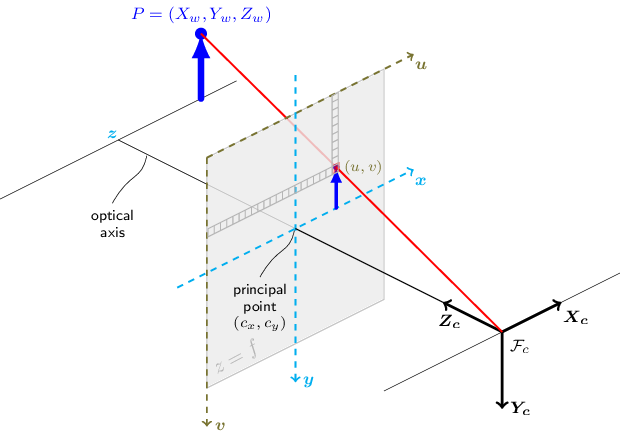

Camera intrinsic matrix:

$$\begin{bmatrix}f_x & 0 & c_x \\ 0 & f_y & c_y \\ 0 & 0 & 1 \end{bmatrix}$$
where:
- $f_x $ and $f_y $: The focal lengths of the camera in pixels, scaled by the sensor's pixel density.
- $f_x = F \cdot s_x$ and $f_y = F \cdot s_y$ where $F$ is the actual focal length, and $s_x$, $s_y$ are scaling factors for pixel density in horizontal and vertical directions.
- $ C_x$ and $c_y$ The coordinates of the principal point (the point where the optical axis intersects the image plane), expressed in pixels.

While the pinhole model assumes an ideal camera, real cameras exhibit optical imperfections such as lens distortion. To account for these, additional parameters like distortion coefficients are introduced during calibration, extending the pinhole model to better reflect reality.



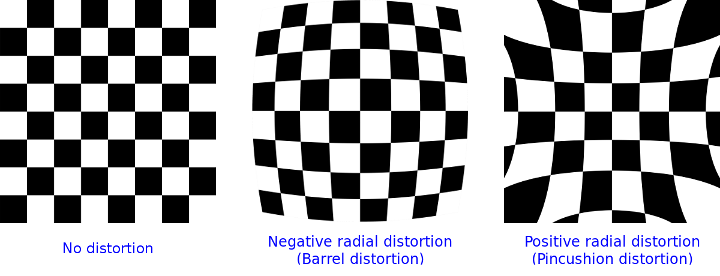


Distortion coefficients describe the optical imperfections of a camera lens, which lead to deviations in the projected image. These coefficients allow us to mathematically model and correct these distortions, ensuring that images represent the real-world scene accurately. In OpenCV, distortion coefficients are typically returned as:
$$dist =  [k_1, k_2, p_1, p_2, k_3]$$

Where:
- Coefficients $k_1, k_2, k_3$ are radial distortion, which causes "barrel" or "pincushion" distortion. Modeled as
$$ x' = x(1+k_1r^2 + k_2r^4+k3r^6)$$
$$ y' = y(1+k_1r^2 + k_2r^4+k3r^6)$$
where $r$ is the distance of a point from the image center.
- Coefficients $p_1, p_2$ are for tangential distortion, witch occurs when the lens and image plane are not perfectly parallel. This misalignment causes the image to be skewed or stretched in certain directions. Is modeled as:
$$ x' = x + [2p_1 xy + p_2(r^2+2x^2)]$$
$$ y' = y+ [p_1(r^2+2x^2) +2p_2 xy ]$$


## Calibration

To eliminate distortions, each camera should be calibrated and the obtained calibration parameters should be used for subsequent image processing.

One of the distorting effects of an image is the effect of curved lines that are further away from the center of the image. This effect can be seen in the visualization below.

For calibration, checkerboards are used, which should in fact be planes (i.e. physically they should not contain imperfections).
Knowing the size of the chessboard (e.g. 6x7) and knowing that the distances between successive tiles are the same, we can calculate analytically what is the error between the image formed on the matrix and reality.

Images used to calculate camera parameters:


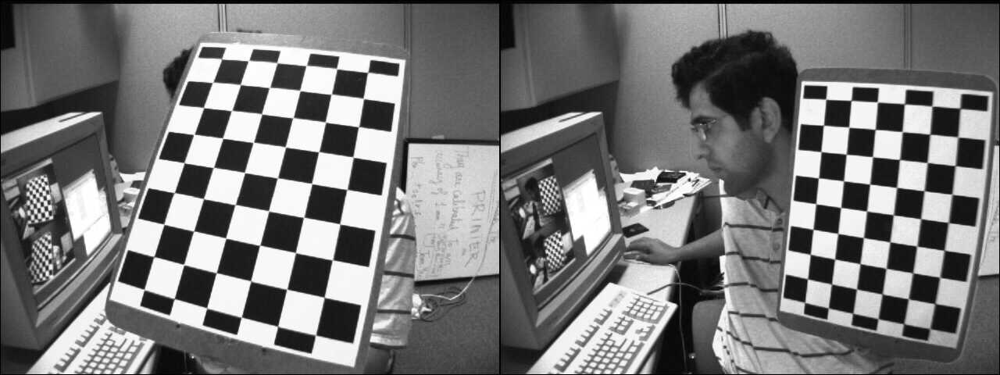

Remaining images:


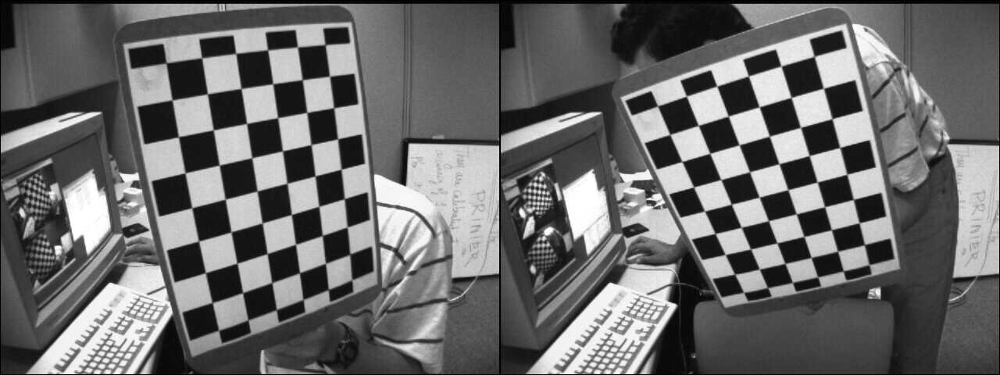

In [ ]:
img_calib = [
    cv2.imread(path, cv2.IMREAD_COLOR) for path in glob.glob("./cam_cal/left0*.jpg")
]
img_calib_gray = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in img_calib]
img_calib_shape = tuple({img.shape for img in img_calib_gray})[0]

img_uncalib = [
    cv2.imread(path, cv2.IMREAD_COLOR) for path in glob.glob("./cam_cal/left1*.jpg")
]
img_uncalib_gray = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in img_uncalib]
img_uncalib_shape = tuple({img.shape for img in img_calib_gray})[0]

print("Images used to calculate camera parameters:")
imshow(np.concatenate(random.sample(img_calib, 2), 1))

print("Remaining images:")
imshow(np.concatenate(random.sample(img_uncalib, 2), 1))

In [ ]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# actual positions of successive corners of the board
objp = np.zeros((6 * 7, 3), np.float32)
objp[:, :2] = np.mgrid[0:7, 0:6].T.reshape(-1, 2)
pprint(objp[:10])

array([[0., 0., 0.],
       [1., 0., 0.],
       [2., 0., 0.],
       [3., 0., 0.],
       [4., 0., 0.],
       [5., 0., 0.],
       [6., 0., 0.],
       [0., 1., 0.],
       [1., 1., 0.],
       [2., 1., 0.]], dtype=float32)


For calibration, it will be necessary to find the corners on the board. You can use the cv2.findChessboardCorners function with the appropriate parameter to determine the location of pixels corresponding to the corners. ([link](http://bmvc2018.org/contents/papers/0508.pdf))



In [ ]:
objpoints, imgpoints = [], []
for img, img_gray in zip(img_calib, img_calib_gray):
    ret, corners = cv2.findChessboardCorners(img_gray, (7, 6), None)
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        corners2 = cv2.cornerSubPix(img_gray, corners, (11, 11), (-1, -1), criteria)
        cv2.drawChessboardCorners(img, (7, 6), corners2, ret)

Images used to calculate camera parameters:


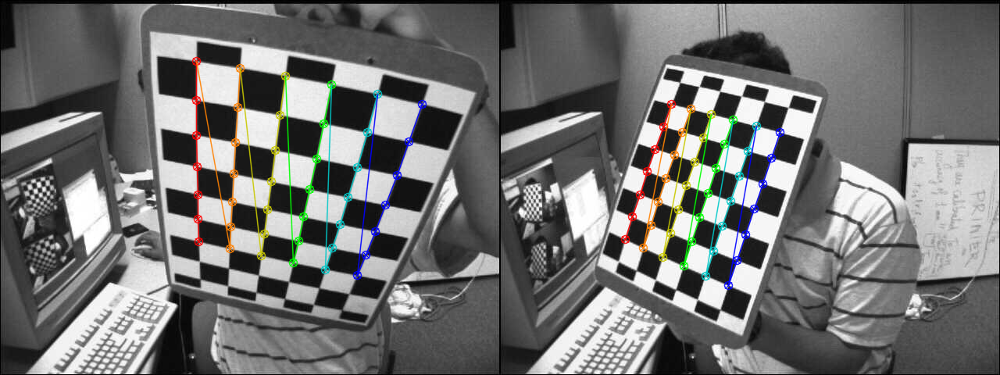

In [ ]:
print("Images used to calculate camera parameters:")
imshow(np.concatenate(random.sample(img_calib, 2), 1))

The last step is to calibrate the camera, where you should enter the pairs: the real positions of the corners (to know which location is which corner) and their locations on the following images.

In [ ]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(
    objpoints, imgpoints, img_calib_shape[::-1], None, None
)

In [ ]:
print("Camera intrinsic matrix")
print(mtx)
print("\nDistortion coefficients")
print(dist)

Camera intrinsic matrix
[[533.62427325   0.         340.81663781]
 [  0.         533.79806917 233.20598497]
 [  0.           0.           1.        ]]

Distortion coefficients
[[-3.09202351e-01  2.27890019e-01  1.63014958e-03 -2.15238244e-04
  -1.97878442e-01]]


Having internal parameters, we can transform each new photo taken from this image in such a way as to get rid of distortions.

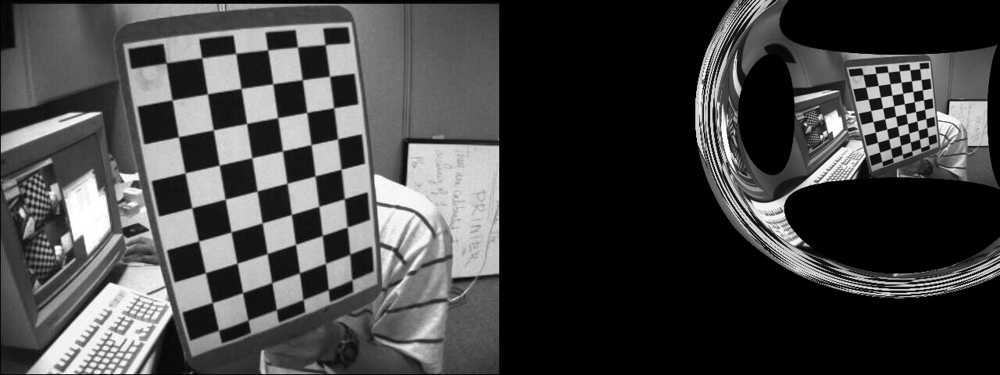

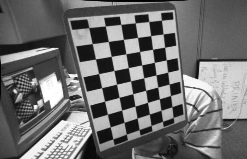

In [ ]:
newcameramtx, roi = cv2.getOptimalNewCameraMatrix(
    mtx, dist, img_uncalib_shape[::-1], 1, img_uncalib_shape[::-1]
)
dst = cv2.undistort(img_uncalib[0], mtx, dist, None, newcameramtx)

imshow(np.concatenate([img_uncalib[0], dst], 1))

x, y, w, h = roi
dst = dst[y : y + h, x : x + w]

imshow(dst)

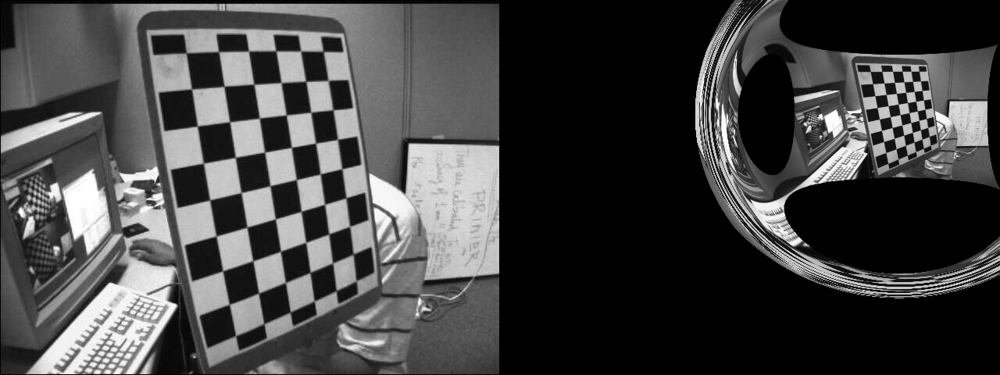

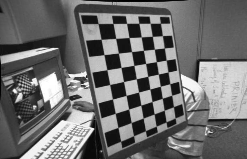

In [ ]:
mapx, mapy = cv2.initUndistortRectifyMap(
    mtx, dist, None, newcameramtx, img_uncalib_shape[::-1], 5
)
dst = cv2.remap(img_uncalib[1], mapx, mapy, cv2.INTER_LINEAR)

imshow(np.concatenate([img_uncalib[1], dst], 1))

x, y, w, h = roi
dst = dst[y : y + h, x : x + w]

imshow(dst)

The error between the actual corner positions transferred by the discovered camera parameters and the corners detected in the image.

In [ ]:
mean_error = 0
for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(imgpoints[i], imgpoints2, cv2.NORM_L2) / len(imgpoints2)
    mean_error += error
print("total error: {}".format(mean_error / len(objpoints)))

total error: 0.023315460314418383


## Pose estimation

Having a calibrated camera and knowing the parameters of a certain object in the image (some reference point, such as a chessboard), we can estimate the pose of this object in the world coordinates rather than  the image coordinates.

A pose should be understood as a shift and rotation of an object in relation to the origin of the coordinates of a given space. Since we know the parameters of the camera, we know what the focal length is, and what pixel sizes are, our coordinate system may be a camera system.

However, knowing the position of the chessboard which we can calculate by finding pixels corresponding to the corners of the chessboard, we can also describe the objects on the scene in relation to the chessboard's coordinate system.

In the example below, 3 axes (x, y, z) with a length of 3 are drawn, the origin of the chessboard coordinate system. Note that the distance ''1'' in the chessboard pattern corresponds to the length of 1 chessboard tile.






In [ ]:
def draw(img, corners, imgpts):
    corner = tuple(corners[0].ravel())
    img = cv2.line(img, corner, tuple(imgpts[0].ravel()), (255, 0, 0), 5)
    img = cv2.line(img, corner, tuple(imgpts[1].ravel()), (0, 255, 0), 5)
    img = cv2.line(img, corner, tuple(imgpts[2].ravel()), (0, 0, 255), 5)
    return img

In [ ]:
axis = np.float32([[3, 0, 0], [0, 3, 0], [0, 0, -3]]).reshape(-1, 3)

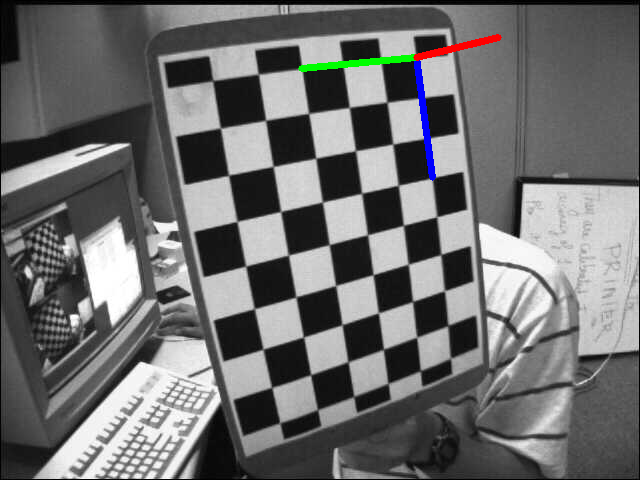

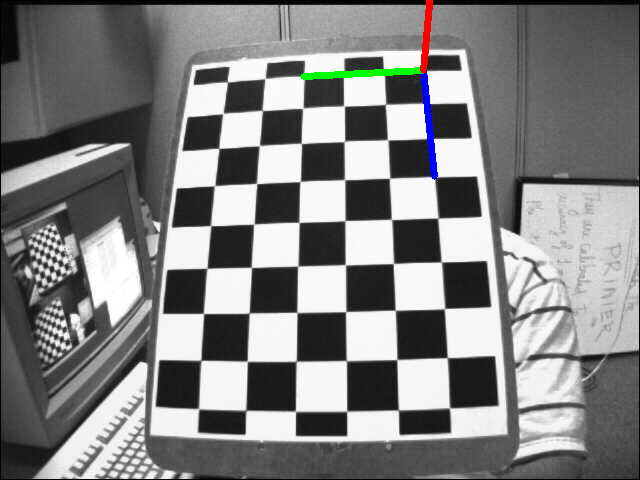

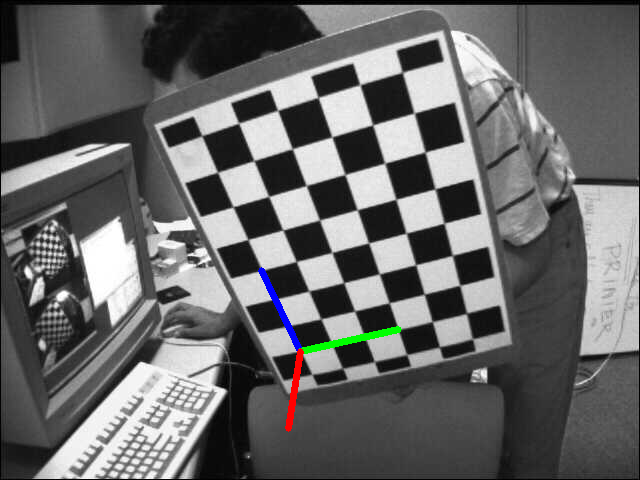

In [ ]:
for img, img_gray in zip(img_uncalib, img_uncalib_gray):
    ret, corners = cv2.findChessboardCorners(img_gray, (7, 6), None)
    if ret == True:
        corners2 = cv2.cornerSubPix(img_gray, corners, (11, 11), (-1, -1), criteria)
        # Find the rotation and translation vectors.
        ret, rvecs, tvecs = cv2.solvePnP(objp, corners2, mtx, dist)
        # project 3D points to image plane
        imgpts, jac = cv2.projectPoints(axis, rvecs, tvecs, mtx, dist)
        img = draw(img, corners2.astype(int), imgpts.astype(int))
        imshow(img)

In [ ]:
def draw(img, corners, imgpts):
    imgpts = np.int32(imgpts).reshape(-1, 2)
    img = cv2.drawContours(img, [imgpts[:4]], -1, (0, 255, 0), -3)
    for i, j in zip(range(4), range(4, 8)):
        img = cv2.line(img, tuple(imgpts[i]), tuple(imgpts[j]), (255), 3)
    img = cv2.drawContours(img, [imgpts[4:]], -1, (0, 0, 255), 3)
    return img

In [ ]:
axis = np.float32(
    [
        [0, 0, 0],
        [0, 3, 0],
        [3, 3, 0],
        [3, 0, 0],
        [0, 0, -3],
        [0, 3, -3],
        [3, 3, -3],
        [3, 0, -3],
    ]
)

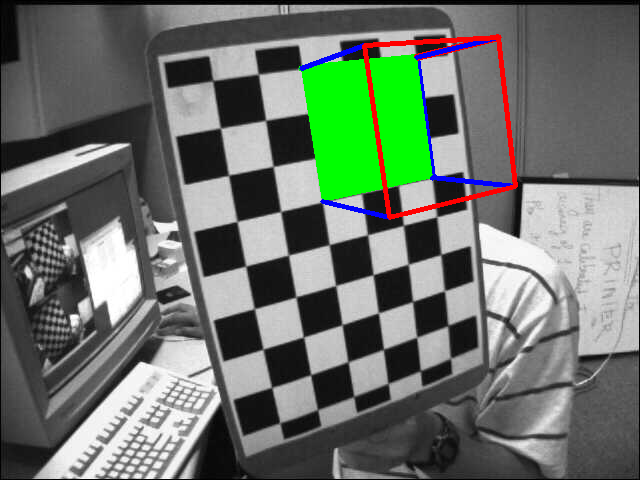

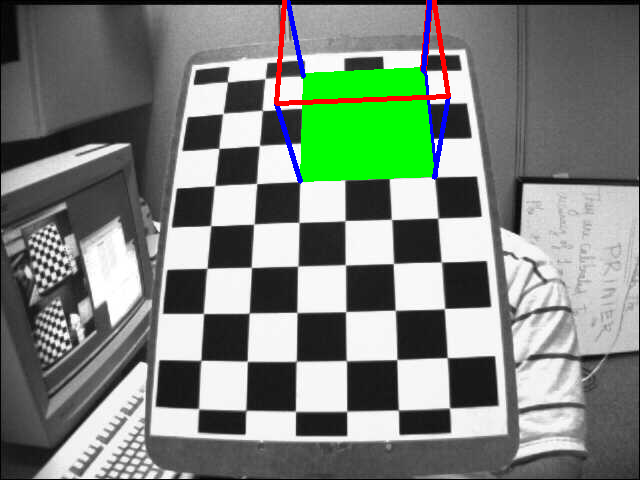

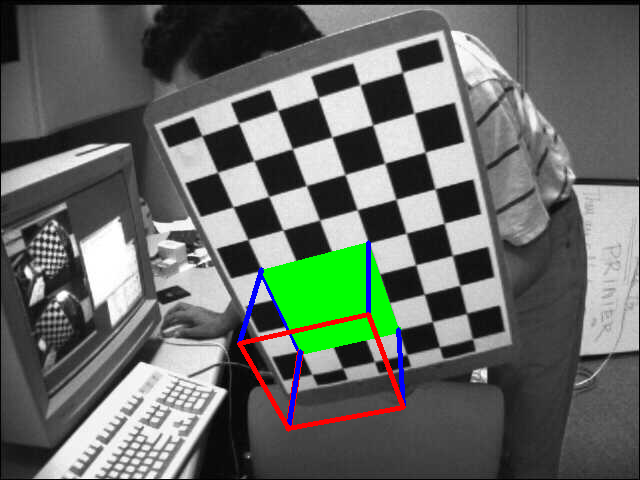

In [ ]:
for img, img_gray in zip(img_uncalib, img_uncalib_gray):
    ret, corners = cv2.findChessboardCorners(img_gray, (7, 6), None)
    if ret == True:
        corners2 = cv2.cornerSubPix(img_gray, corners, (11, 11), (-1, -1), criteria)
        ret, rvecs, tvecs = cv2.solvePnP(objp, corners2, mtx, dist)
        imgpts, jac = cv2.projectPoints(axis, rvecs, tvecs, mtx, dist)
        img = draw(img, corners2.astype(int), imgpts.astype(int))
        imshow(img)

Pose estimation is essential in robotics for enabling precise object manipulation, such as a robotic arm grasping an object by accurately determining its position and orientation relative to the camera. It is also critical for autonomous navigation, where a robot uses pose information to localize itself within an environment and plan paths to avoid obstacles or reach a target.

## Depth estimation

A person looking with both eyes is able to 'sense' the distance from the object he is looking at. This skill is (mainly) caused by stereovision - the ability to analyze the same object from 2 image sources, between which we **know the transformation**.

**Note:** currently conducted research is more and more inclined to the thesis that the depth can also be 'extracted' from the very description of the scene (such as segmentation, knowledge of basic shapes and even the basic laws of physics).

OpenCV includes a ready algorithm for estimating image depth from stereovision. This algorithm does not include the functionality of direct depth estimation (understood as the distance from the camera). More details about the algorithm can be found in the article itself: [link](https://www.cs.cmu.edu/~motionplanning/papers/sbp_papers/integrated1/konolidge_stereo_vision.pdf).

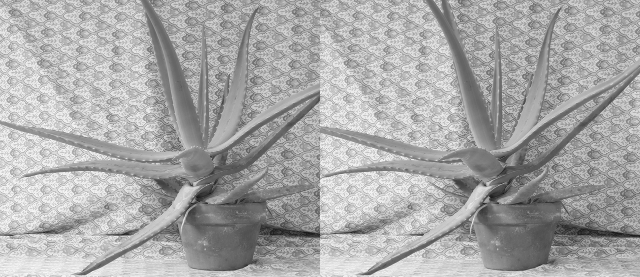

In [ ]:
img_left = cv2.imread("left-aloe-image.png", 0)
img_right = cv2.imread("right-aloe-image.png", 0)
imshow(np.concatenate([img_left, img_right], 1))

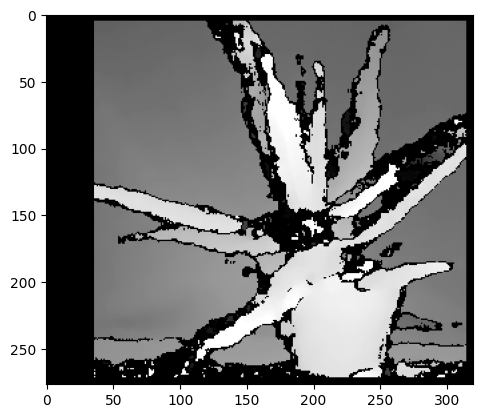

In [ ]:
stereo = cv2.StereoBM_create(numDisparities=32, blockSize=11)
disparity = stereo.compute(img_left, img_right)
plt.imshow(disparity, "gray")
plt.show()

In [ ]:
disparity2 = (disparity - np.min(disparity)) / 4
# disparity2 = cv2.blur(disparity2,(5,5))

In [ ]:
img_color = cv2.imread("left-aloe-image.png")

In [ ]:
(r, c) = np.shape(img_left)
(X, Y) = np.meshgrid(range(0, c, 1), range(0, r, 1))
pix_show(
    X.flatten(), Y.flatten(), disparity2.flatten(), colors=img_color.reshape(-1, 3)
)

# Image

## Shape detection

An image understood as a function may contain certain characteristic areas. Such areas can be lines, circles or other geometric figures that can be approximated mathematically while designing an algorithm to find them.

The most frequently used algorithm for detecting lines and circles is the Hough transform. This algorithm is based on checking all possible straight lines passing through the detected point (e.g. on the basis of laplasian edge detection) and voting which straight line is most often present in the image.

The algorithm works in a similar way for circles (centers of circles), and the idea behind the algorithm is the Radon transform, which in turn is used in a similar way in electromagnetic resonance imaging.

In [ ]:
sudoku = cv2.imread("./sudoku.png", cv2.IMREAD_COLOR)
imshow(sudoku)

In [ ]:
sudoku_gray = cv2.cvtColor(sudoku, cv2.COLOR_BGR2GRAY)
sudoku_th = cv2.adaptiveThreshold(
    sudoku_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 10
)
sudoku_edges = cv2.Canny(sudoku_th, 50, 150, apertureSize=3)

imshow(np.concatenate([sudoku_th, sudoku_edges], 1))

In [ ]:
_sudoku = sudoku.copy()
lines = cv2.HoughLines(sudoku_edges, 1, np.pi / 180, 180)
for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv2.line(_sudoku, (x1, y1), (x2, y2), (0, 0, 255), 2)
imshow(_sudoku)

In [ ]:
_sudoku = sudoku.copy()
lines = cv2.HoughLinesP(
    sudoku_edges, 1, np.pi / 180, 100, minLineLength=100, maxLineGap=10
)
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(_sudoku, (x1, y1), (x2, y2), (0, 255, 0), 2)
imshow(_sudoku)

In [ ]:
skittles = cv2.imread("./skittles.jpg", cv2.IMREAD_COLOR)
skittles_gray = cv2.cvtColor(skittles, cv2.COLOR_BGR2GRAY)

circles = cv2.HoughCircles(
    skittles_gray,
    cv2.HOUGH_GRADIENT,
    1,
    50,
    param1=200,
    param2=15,
    minRadius=30,
    maxRadius=60,
)
circles = np.uint16(np.around(circles))
print("Number of circles found:", len(circles[0]))
for i in circles[0, :]:
    cv2.circle(skittles, (i[0], i[1]), i[2], (0, 255, 0), 2)
    cv2.circle(skittles, (i[0], i[1]), 2, (0, 0, 255), 3)
imshow(skittles)

## Schema detection

During the earlier classes, the idea behind the correlation (or convolution) operation was introduced. For normalized data, the result of the 2 function correlation operation will be the image where the highest values will be in the place where the given sub-area is most similar to the second image.

The OpenCV library includes a function ''matchTemplate()'' that follows the above scheme, also for multichannel images.

A frame from the broadcast of a football match is presented below. One of the players was specified as the pattern he was looking for. As the players have uniforms of the same color, the algorithm should find players from the same team first.


In [ ]:
pleng = cv2.imread("./pl_eng.png", cv2.IMREAD_COLOR)
pleng_template = cv2.imread("./template.png", cv2.IMREAD_COLOR)
_, w, h = pleng_template.shape[::-1]

imshow(pleng_template)
imshow(pleng)

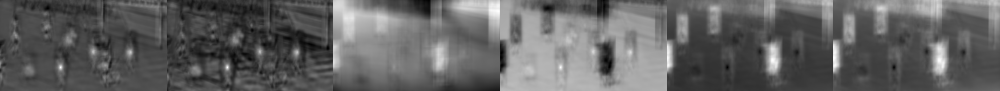

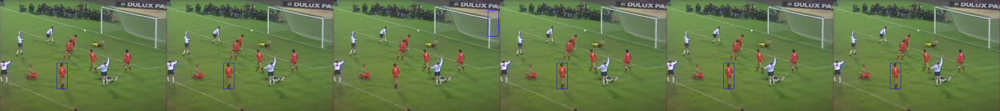

In [ ]:
methods = [
    cv2.TM_CCOEFF,
    cv2.TM_CCOEFF_NORMED,
    cv2.TM_CCORR,
    cv2.TM_CCORR_NORMED,
    cv2.TM_SQDIFF,
    cv2.TM_SQDIFF_NORMED,
]
results_rgb = []
results_prob = []
for method in methods:
    _pleng = pleng.copy()
    # Apply template Matching
    res = cv2.matchTemplate(_pleng, pleng_template, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv2.rectangle(_pleng, top_left, bottom_right, (255, 0, 0), 2)

    results_rgb.append(_pleng)
    results_prob.append((res - res.min()) * 255 / (res.max() - res.min()))

imshow(np.concatenate(results_prob, 1))
imshow(np.concatenate(results_rgb, 1))

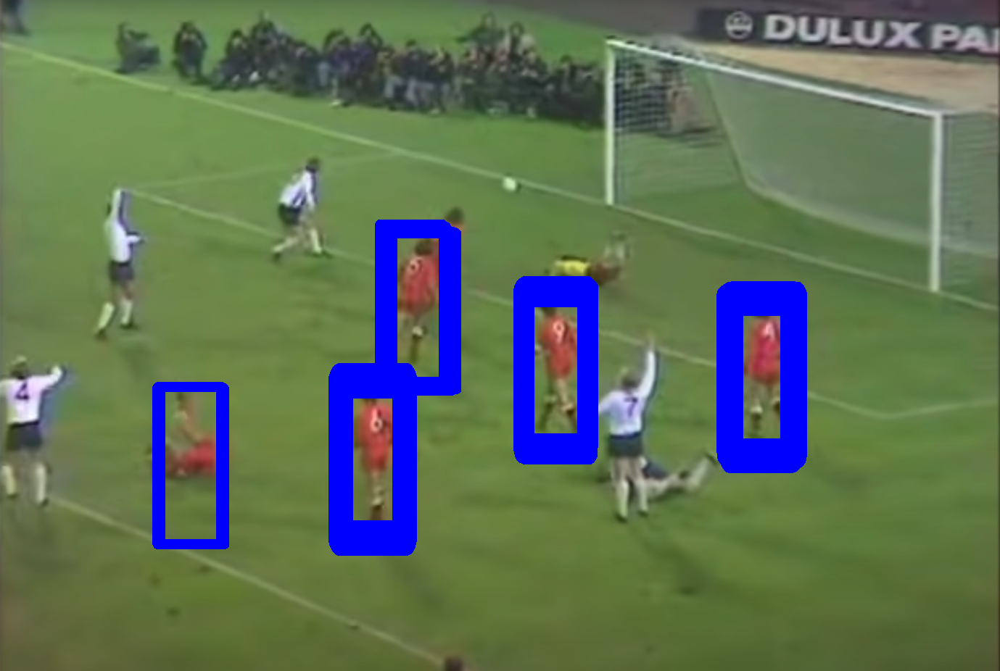

In [ ]:
_pleng = pleng.copy()

res = cv2.matchTemplate(_pleng, pleng_template, cv2.TM_CCOEFF_NORMED)
loc = np.where(res >= 0.4)
for pt in zip(*loc[::-1]):
    cv2.rectangle(_pleng, pt, (pt[0] + w, pt[1] + h), (255, 0, 0), 2)

imshow(_pleng)


## Face detection

One of the first face detection algorithms was the one proposed by the authors Paul Viola and Michael Jones in Rapid Object Detection using a Boosted Cascade of Simple Features (2001). The algorithm for predefined binary masks (**Haar feature**: eg, horizontal or vertical image split in half, checkerboard, etc.) calculates the average pixel intensity under each area on the mask. The computed descriptors are then used to learn the machine learning algorithm - Cascade Classifiers.

Since it is a machine learning algorithm, the model training stage is necessary, and each time it is inferential, it is necessary to use the previously calculated parameters to optimize the algorithm's work.



In [ ]:
face_detector = cv2.CascadeClassifier()
eye_detector = cv2.CascadeClassifier()

if face_detector.load("haar_face.xml"):
    print("Face detector loaded")

if eye_detector.load("haar_eye.xml"):
    print("Eye detector loaded")

Face detector loaded
Eye detector loaded


In [ ]:
def detect_face(img, face_detector, eye_detector):
    img = img.copy()
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_gray = cv2.equalizeHist(img_gray)

    faces = face_detector.detectMultiScale(img_gray)
    for x, y, w, h in faces:
        center = (x + w // 2, y + h // 2)
        frame = cv2.ellipse(img, center, (w // 2, h // 2), 0, 0, 360, (255, 0, 255), 4)
        img_face = img_gray[y : y + h, x : x + w]

        eyes = eye_detector.detectMultiScale(img_face)
        for x2, y2, w2, h2 in eyes:
            eye_center = (x + x2 + w2 // 2, y + y2 + h2 // 2)
            radius = int(round((w2 + h2) * 0.25))
            frame = cv2.circle(img, eye_center, radius, (255, 0, 0), 4)
    imshow(img)

Image generated by: https://arxiv.org/abs/1912.04958
(https://thispersondoesnotexist.com/)

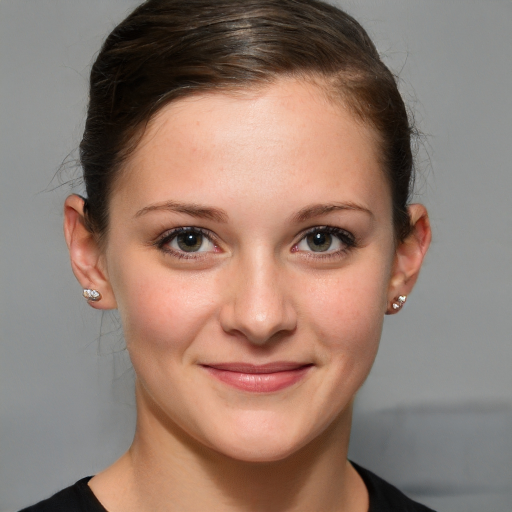

In [ ]:
face = cv2.imread("./face.jpeg", cv2.IMREAD_COLOR)
face = cv2.resize(face, (512, 512))
imshow(face)

In [ ]:
detect_face(face, face_detector, eye_detector)


## Denoising

Among the functionalities of the OpenCV library you can also find image enhancement operations. One of them is the operation of removing noise from an image.

The operation ''fastNlMeansDenoisingColored'' is based on the article [link] (http://www.ipol.im/pub/art/2011/bcm_nlm/) which describes the noise removal algorithm based on the similarity and count of the neighbor pixel intensity values.

To present the operation of the algorithm, Gauss noise will be added to the image first, and then, using the OpenCV library, an attempt will be made to remove this noise.

In [ ]:
face_noise = face.astype(np.float32) + np.random.normal(0, 5, face.shape)
face_noise = np.clip(face_noise, 0, 255).astype(np.uint8)

imshow(face_noise)


In [ ]:
n1 = cv2.resize(face[:50, :50], (256, 256))
n2 = cv2.resize(face_noise[:50, :50], (256, 256))
imshow(np.concatenate([n1, n2], 1))


In [ ]:
face_denoise = cv2.fastNlMeansDenoisingColored(face_noise, None, 7, 7, 7, 5)
imshow(face_denoise)


In [ ]:
n3 = cv2.resize(face_denoise[:50, :50], (256, 256))
imshow(np.concatenate([n1, n2, n3], 1))


## Inpainting

The problem of inpainting areas is calculating the intensity of the missing pixels from the rest of the image. The addition may be based on the immediate neighborhood, on the semantic understanding of the scene, or on information from the user about what is to be there.



OpenCV includes the implementation of the algorithms proposed in the works [An Image Inpainting Technique Based on
the Fast Marching Method](http://www.olivier-augereau.com/docs/2004JGraphToolsTelea.pdf) and [Navier-Stokes, Fluid Dynamics, and Image and Video Inpainting](https://www.math.ucla.edu/~bertozzi/papers/cvpr01.pdf),  ''cv2.inpaint()'' with flags
flags=cv2.INPAINT_TELEA lub cv2.INPAINT_NS.

In [ ]:
skittles = cv2.imread("./skittles.jpg", cv2.IMREAD_COLOR)
skittles_inpaint_mask = np.zeros(skittles.shape[:2], np.uint8)
skittles_inpaint_mask[50:60, 40:150] = 255
skittles_inpaint_mask[190:220, 50:70] = 255
skittles_inpaint_mask[300:380, 360:370] = 255
skittles_inpaint_mask[250:300, 510:560] = 255
skittles_inpaint_mask[510:530, 310:720] = 255
imshow(skittles_inpaint_mask)

In [ ]:
skittles = cv2.bitwise_and(skittles, skittles, mask=~skittles_inpaint_mask)
imshow(skittles)


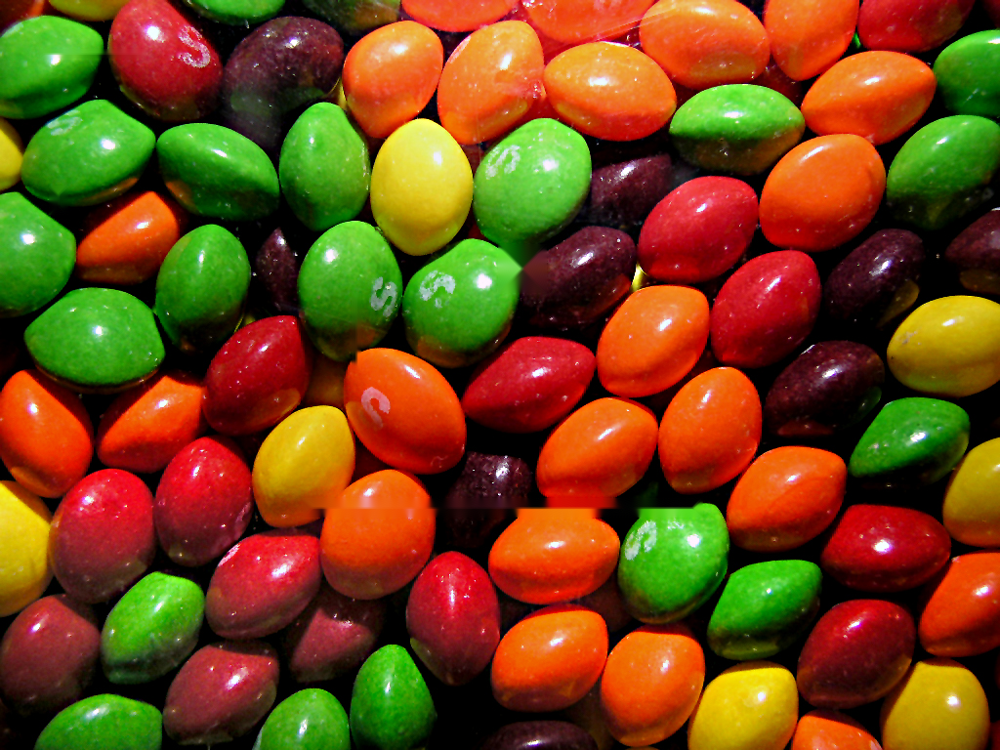

In [ ]:
skittles_inpaint = cv2.inpaint(skittles, skittles_inpaint_mask, 3, cv2.INPAINT_TELEA)
imshow(skittles_inpaint)


## HDR

The idea of HDR image comes from the difference between what technology can save digitally and what a human really sees. The camera, **for a certain set of set parameters**, can digitally save the image displayed on the matrix. The question is, what set of parameters best reflects what a person sees. And more broadly: with the current technology, can we get a picture that reflects what a person sees with one shot (one set of parameters).

Currently, HDR images are obtained using a series of photos taken in the shortest possible time interval, created with different exposure times of the matrix. This series is combined into one image according to a given algorithm.

OpenCV includes several implementations of such algorithms:
- cv2.createMergeDebevec()
- cv2.createMergeRobertson()
- cv2.createMergeMertens() - it is the only one that does not need exposure times.


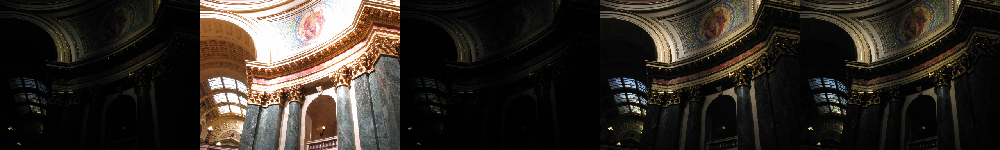

In [ ]:
hdr_images_paths = glob.glob("./hdr/aligned*.jpg")
hdr_images = [
    cv2.resize(cv2.imread(path, cv2.IMREAD_COLOR), None, fx=0.25, fy=0.25)
    for path in hdr_images_paths
]

imshow(np.concatenate(random.sample(hdr_images, 5), 1))

In [ ]:
hdr_ex_t = np.array(
    [
        Image.open(path)._getexif().get(Base.ExposureTime.value)
        for path in hdr_images_paths
    ]
)
hdr_ex_t = np.array([ext for ext in hdr_ex_t], np.float32)
print("Exposure times:\n", hdr_ex_t)

Exposure times:
 [3.9999999e-02 1.6666668e-02 6.2500001e-03 1.0000000e+00 7.6923080e-02
 7.9999998e-04 2.0000000e-01 6.0000002e-01 1.3000000e+00 6.6666670e-02
 5.0000001e-02 4.9999999e-03 1.6000000e+00 2.0000000e-02 2.5000000e-01
 3.3333335e-02 5.0000000e-01 2.5000000e-02 2.0000001e-03 3.1250000e-03
 1.2500000e-01 1.5625000e-03 2.4999999e-03 4.0000001e-01 8.0000001e-01
 8.0000004e-03 4.0000002e-03 1.2500000e-02 1.0000000e-01 1.6666667e-01]


In [ ]:
tonemap = cv2.createTonemap(gamma=2.2)

merge_debevec = cv2.createMergeDebevec()
merge_robertson = cv2.createMergeRobertson()
merge_mertens = cv2.createMergeMertens()
v = 0

hdr_debevec = merge_debevec.process(hdr_images, times=hdr_ex_t.copy())
hdr_robertson = merge_robertson.process(hdr_images, times=hdr_ex_t.copy())
hdr_mertens = merge_mertens.process(hdr_images)

hdr_debevec = tonemap.process(hdr_debevec.copy())

hdr_debevec = np.clip(hdr_debevec * 255, 0, 255).astype("uint8")
hdr_robertson = np.clip(hdr_robertson * 255, 0, 255).astype("uint8")
hdr_mertens = np.clip(hdr_mertens * 255, 0, 255).astype("uint8")

imshow(np.concatenate([hdr_debevec, hdr_robertson, hdr_mertens], 1))